In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import datetime

In [2]:
import plotly.express as px
import bar_chart_race as bcr
from IPython.display import Image
import os

In [3]:
import warnings
warnings.filterwarnings("ignore")

In [4]:
data = pd.read_csv(r"C:\Users\manoj\OneDrive\Desktop\Sept_internship\Electric Vechile data\dataset.csv")

In [5]:
data

,VIN (1-10),County,City,State,Postal Code,Model Year,Make,Model,Electric Vehicle Type,Clean Alternative Fuel Vehicle (CAFV) Eligibility,Electric Range,Base MSRP,Legislative District,DOL Vehicle ID,Vehicle Location,Electric Utility,2020 Census Tract
0,JTMEB3FV6N,Monroe,Key West,FL,33040,2022,TOYOTA,RAV4 PRIME,Plug-in Hybrid Electric Vehicle (PHEV),Clean Alternative Fuel Vehicle Eligible,42,0,NaN,198968248,POINT (-81.80023 24.5545),NaN,12087972100
1,1G1RD6E45D,Clark,Laughlin,NV,89029,2013,CHEVROLET,VOLT,Plug-in Hybrid Electric Vehicle (PHEV),Clean Alternative Fuel Vehicle Eligible,38,0,NaN,5204412,POINT (-114.57245 35.16815),NaN,32003005702
2,JN1AZ0CP8B,Yakima,Yakima,WA,98901,2011,NISSAN,LEAF,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,73,0,15.0,218972519,POINT (-120.50721 46.60448),PACIFICORP,53077001602
3,1G1FW6S08H,Skagit,Concrete,WA,98237,2017,CHEVROLET,BOLT EV,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,238,0,39.0,186750406,POINT (-121.7515 48.53892),PUGET SOUND ENERGY INC,53057951101
4,3FA6P0SU1K,Snohomish,Everett,WA,98201,2019,FORD,FUSION,Plug-in Hybrid Electric Vehicle (PHEV),Not eligible due to low battery range,26,0,38.0,2006714,POINT (-122.20596 47.97659),PUGET SOUND ENERGY INC,53061041500
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
112629,7SAYGDEF2N,King,Duvall,WA,98019,2022,TESLA,MODEL Y,Battery Electric Vehicle (BEV),Eligibility unknown as battery range has not b...,0,0,45.0,217955265,POINT (-121.98609 47.74068),PUGET SOUND ENERGY INC||CITY OF TACOMA - (WA),53033032401
112630,1N4BZ1CP7K,San Juan,Friday Harbor,WA,98250,2019,NISSAN,LEAF,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,150,0,40.0,103663227,POINT (-123.01648 48.53448),BONNEVILLE POWER ADMINISTRATION||ORCAS POWER &...,53055960301
112631,1FMCU0KZ4N,King,Vashon,WA,98070,2022,FORD,ESCAPE,Plug-in Hybrid Electric Vehicle (PHEV),Clean Alternative Fuel Vehicle Eligible,38,0,34.0,193878387,POINT (-122.4573 47.44929),PUGET SOUND ENERGY INC||CITY OF TACOMA - (WA),53033027702
112632,KNDCD3LD4J,King,Covington,WA,98042,2018,KIA,NIRO,Plug-in Hybrid Electric Vehicle (PHEV),Not eligible due to low battery range,26,0,47.0,125039043,POINT (-122.09124 47.33778),PUGET SOUND ENERGY INC||CITY OF TACOMA - (WA),53033032007


In [6]:
data.shape

(112634, 17)

In [7]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 112634 entries, 0 to 112633
Data columns (total 17 columns):
 #   Column                                             Non-Null Count   Dtype  
---  ------                                             --------------   -----  
 0   VIN (1-10)                                         112634 non-null  object 
 1   County                                             112634 non-null  object 
 2   City                                               112634 non-null  object 
 3   State                                              112634 non-null  object 
 4   Postal Code                                        112634 non-null  int64  
 5   Model Year                                         112634 non-null  int64  
 6   Make                                               112634 non-null  object 
 7   Model                                              112614 non-null  object 
 8   Electric Vehicle Type                              112634 non-null  object

In [8]:
data.isna().sum()

VIN (1-10)                                             0
County                                                 0
City                                                   0
State                                                  0
Postal Code                                            0
Model Year                                             0
Make                                                   0
Model                                                 20
Electric Vehicle Type                                  0
Clean Alternative Fuel Vehicle (CAFV) Eligibility      0
Electric Range                                         0
Base MSRP                                              0
Legislative District                                 286
DOL Vehicle ID                                         0
Vehicle Location                                      24
Electric Utility                                     443
2020 Census Tract                                      0
dtype: int64

In [9]:
data.duplicated().sum()

0

In [10]:
data.dropna(inplace = True)

In [11]:
data

,VIN (1-10),County,City,State,Postal Code,Model Year,Make,Model,Electric Vehicle Type,Clean Alternative Fuel Vehicle (CAFV) Eligibility,Electric Range,Base MSRP,Legislative District,DOL Vehicle ID,Vehicle Location,Electric Utility,2020 Census Tract
2,JN1AZ0CP8B,Yakima,Yakima,WA,98901,2011,NISSAN,LEAF,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,73,0,15.0,218972519,POINT (-120.50721 46.60448),PACIFICORP,53077001602
3,1G1FW6S08H,Skagit,Concrete,WA,98237,2017,CHEVROLET,BOLT EV,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,238,0,39.0,186750406,POINT (-121.7515 48.53892),PUGET SOUND ENERGY INC,53057951101
4,3FA6P0SU1K,Snohomish,Everett,WA,98201,2019,FORD,FUSION,Plug-in Hybrid Electric Vehicle (PHEV),Not eligible due to low battery range,26,0,38.0,2006714,POINT (-122.20596 47.97659),PUGET SOUND ENERGY INC,53061041500
5,5YJ3E1EB5J,Snohomish,Bothell,WA,98021,2018,TESLA,MODEL 3,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,215,0,1.0,475635324,POINT (-122.18384 47.8031),PUGET SOUND ENERGY INC,53061051916
6,1N4AZ0CP4D,Snohomish,Everett,WA,98203,2013,NISSAN,LEAF,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,75,0,38.0,253546023,POINT (-122.23019 47.94949),PUGET SOUND ENERGY INC,53061040900
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
112629,7SAYGDEF2N,King,Duvall,WA,98019,2022,TESLA,MODEL Y,Battery Electric Vehicle (BEV),Eligibility unknown as battery range has not b...,0,0,45.0,217955265,POINT (-121.98609 47.74068),PUGET SOUND ENERGY INC||CITY OF TACOMA - (WA),53033032401
112630,1N4BZ1CP7K,San Juan,Friday Harbor,WA,98250,2019,NISSAN,LEAF,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,150,0,40.0,103663227,POINT (-123.01648 48.53448),BONNEVILLE POWER ADMINISTRATION||ORCAS POWER &...,53055960301
112631,1FMCU0KZ4N,King,Vashon,WA,98070,2022,FORD,ESCAPE,Plug-in Hybrid Electric Vehicle (PHEV),Clean Alternative Fuel Vehicle Eligible,38,0,34.0,193878387,POINT (-122.4573 47.44929),PUGET SOUND ENERGY INC||CITY OF TACOMA - (WA),53033027702
112632,KNDCD3LD4J,King,Covington,WA,98042,2018,KIA,NIRO,Plug-in Hybrid Electric Vehicle (PHEV),Not eligible due to low battery range,26,0,47.0,125039043,POINT (-122.09124 47.33778),PUGET SOUND ENERGY INC||CITY OF TACOMA - (WA),53033032007


In [12]:
data.shape

(112152, 17)

In [13]:
data

,VIN (1-10),County,City,State,Postal Code,Model Year,Make,Model,Electric Vehicle Type,Clean Alternative Fuel Vehicle (CAFV) Eligibility,Electric Range,Base MSRP,Legislative District,DOL Vehicle ID,Vehicle Location,Electric Utility,2020 Census Tract
2,JN1AZ0CP8B,Yakima,Yakima,WA,98901,2011,NISSAN,LEAF,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,73,0,15.0,218972519,POINT (-120.50721 46.60448),PACIFICORP,53077001602
3,1G1FW6S08H,Skagit,Concrete,WA,98237,2017,CHEVROLET,BOLT EV,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,238,0,39.0,186750406,POINT (-121.7515 48.53892),PUGET SOUND ENERGY INC,53057951101
4,3FA6P0SU1K,Snohomish,Everett,WA,98201,2019,FORD,FUSION,Plug-in Hybrid Electric Vehicle (PHEV),Not eligible due to low battery range,26,0,38.0,2006714,POINT (-122.20596 47.97659),PUGET SOUND ENERGY INC,53061041500
5,5YJ3E1EB5J,Snohomish,Bothell,WA,98021,2018,TESLA,MODEL 3,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,215,0,1.0,475635324,POINT (-122.18384 47.8031),PUGET SOUND ENERGY INC,53061051916
6,1N4AZ0CP4D,Snohomish,Everett,WA,98203,2013,NISSAN,LEAF,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,75,0,38.0,253546023,POINT (-122.23019 47.94949),PUGET SOUND ENERGY INC,53061040900
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
112629,7SAYGDEF2N,King,Duvall,WA,98019,2022,TESLA,MODEL Y,Battery Electric Vehicle (BEV),Eligibility unknown as battery range has not b...,0,0,45.0,217955265,POINT (-121.98609 47.74068),PUGET SOUND ENERGY INC||CITY OF TACOMA - (WA),53033032401
112630,1N4BZ1CP7K,San Juan,Friday Harbor,WA,98250,2019,NISSAN,LEAF,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,150,0,40.0,103663227,POINT (-123.01648 48.53448),BONNEVILLE POWER ADMINISTRATION||ORCAS POWER &...,53055960301
112631,1FMCU0KZ4N,King,Vashon,WA,98070,2022,FORD,ESCAPE,Plug-in Hybrid Electric Vehicle (PHEV),Clean Alternative Fuel Vehicle Eligible,38,0,34.0,193878387,POINT (-122.4573 47.44929),PUGET SOUND ENERGY INC||CITY OF TACOMA - (WA),53033027702
112632,KNDCD3LD4J,King,Covington,WA,98042,2018,KIA,NIRO,Plug-in Hybrid Electric Vehicle (PHEV),Not eligible due to low battery range,26,0,47.0,125039043,POINT (-122.09124 47.33778),PUGET SOUND ENERGY INC||CITY OF TACOMA - (WA),53033032007


In [14]:
data.columns

Index(['VIN (1-10)', 'County', 'City', 'State', 'Postal Code', 'Model Year',
       'Make', 'Model', 'Electric Vehicle Type',
       'Clean Alternative Fuel Vehicle (CAFV) Eligibility', 'Electric Range',
       'Base MSRP', 'Legislative District', 'DOL Vehicle ID',
       'Vehicle Location', 'Electric Utility', '2020 Census Tract'],
      dtype='object')

In [15]:
col_name = []
for col in data.columns:
    columns = col.strip().lower()

    col_name.append(columns)
data.columns = col_name
print(data.columns)

Index(['vin (1-10)', 'county', 'city', 'state', 'postal code', 'model year',
       'make', 'model', 'electric vehicle type',
       'clean alternative fuel vehicle (cafv) eligibility', 'electric range',
       'base msrp', 'legislative district', 'dol vehicle id',
       'vehicle location', 'electric utility', '2020 census tract'],
      dtype='object')


In [16]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 112152 entries, 2 to 112633
Data columns (total 17 columns):
 #   Column                                             Non-Null Count   Dtype  
---  ------                                             --------------   -----  
 0   vin (1-10)                                         112152 non-null  object 
 1   county                                             112152 non-null  object 
 2   city                                               112152 non-null  object 
 3   state                                              112152 non-null  object 
 4   postal code                                        112152 non-null  int64  
 5   model year                                         112152 non-null  int64  
 6   make                                               112152 non-null  object 
 7   model                                              112152 non-null  object 
 8   electric vehicle type                              112152 non-null  object

In [17]:
data['model year'].dtype

dtype('int64')

In [18]:
data.head()

,vin (1-10),county,city,state,postal code,model year,make,model,electric vehicle type,clean alternative fuel vehicle (cafv) eligibility,electric range,base msrp,legislative district,dol vehicle id,vehicle location,electric utility,2020 census tract
2,JN1AZ0CP8B,Yakima,Yakima,WA,98901,2011,NISSAN,LEAF,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,73,0,15.0,218972519,POINT (-120.50721 46.60448),PACIFICORP,53077001602
3,1G1FW6S08H,Skagit,Concrete,WA,98237,2017,CHEVROLET,BOLT EV,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,238,0,39.0,186750406,POINT (-121.7515 48.53892),PUGET SOUND ENERGY INC,53057951101
4,3FA6P0SU1K,Snohomish,Everett,WA,98201,2019,FORD,FUSION,Plug-in Hybrid Electric Vehicle (PHEV),Not eligible due to low battery range,26,0,38.0,2006714,POINT (-122.20596 47.97659),PUGET SOUND ENERGY INC,53061041500
5,5YJ3E1EB5J,Snohomish,Bothell,WA,98021,2018,TESLA,MODEL 3,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,215,0,1.0,475635324,POINT (-122.18384 47.8031),PUGET SOUND ENERGY INC,53061051916
6,1N4AZ0CP4D,Snohomish,Everett,WA,98203,2013,NISSAN,LEAF,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,75,0,38.0,253546023,POINT (-122.23019 47.94949),PUGET SOUND ENERGY INC,53061040900


### Univariate analysis

In [19]:
data['county'].value_counts()

King            58980
Snohomish       12412
Pierce           8525
Clark            6681
Thurston         4109
Kitsap           3828
Whatcom          2839
Spokane          2785
Benton           1376
Island           1298
Skagit           1228
Clallam           728
San Juan          717
Jefferson         698
Chelan            654
Yakima            617
Cowlitz           569
Mason             547
Lewis             431
Grays Harbor      402
Kittitas          392
Franklin          365
Grant             335
Walla Walla       312
Douglas           221
Whitman           177
Klickitat         175
Okanogan          149
Pacific           145
Skamania          139
Stevens            91
Asotin             48
Wahkiakum          39
Adams              34
Pend Oreille       32
Lincoln            30
Ferry              27
Columbia           13
Garfield            4
Name: county, dtype: int64

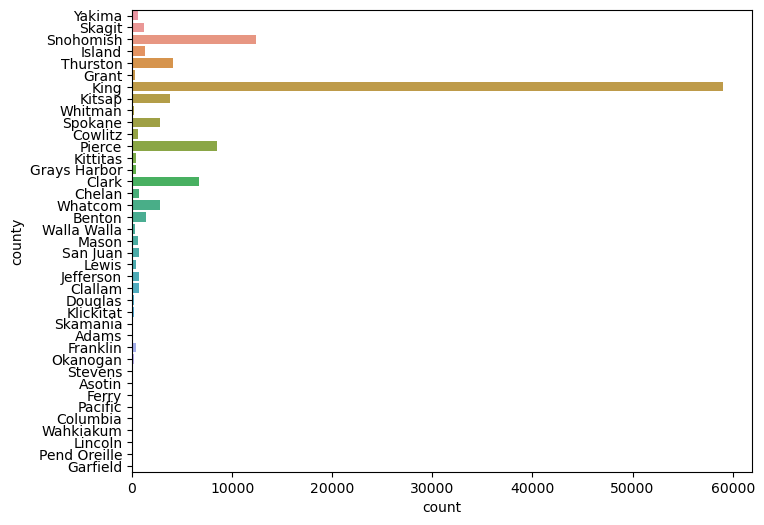

In [20]:
plt.figure(figsize=(8, 6))

sns.countplot(y = data['county']) 
plt.show()

In [21]:
data['model'].value_counts().head(10)

MODEL 3        23042
MODEL Y        17086
LEAF           12846
MODEL S         7346
BOLT EV         4895
VOLT            4870
MODEL X         4355
PRIUS PRIME     2365
NIRO            2252
I3              1888
Name: model, dtype: int64

In [22]:
data['make'].value_counts()

TESLA             51883
NISSAN            12846
CHEVROLET         10140
FORD               5780
BMW                4660
KIA                4469
TOYOTA             4368
VOLKSWAGEN         2507
AUDI               2320
VOLVO              2256
CHRYSLER           1780
HYUNDAI            1407
JEEP               1143
RIVIAN              883
FIAT                820
PORSCHE             817
HONDA               788
MINI                631
MITSUBISHI          585
POLESTAR            557
MERCEDES-BENZ       503
SMART               271
JAGUAR              218
LINCOLN             167
CADILLAC            108
LUCID MOTORS         65
SUBARU               59
LAND ROVER           38
LEXUS                33
FISKER               19
GENESIS              18
AZURE DYNAMICS        7
TH!NK                 3
BENTLEY               3
Name: make, dtype: int64

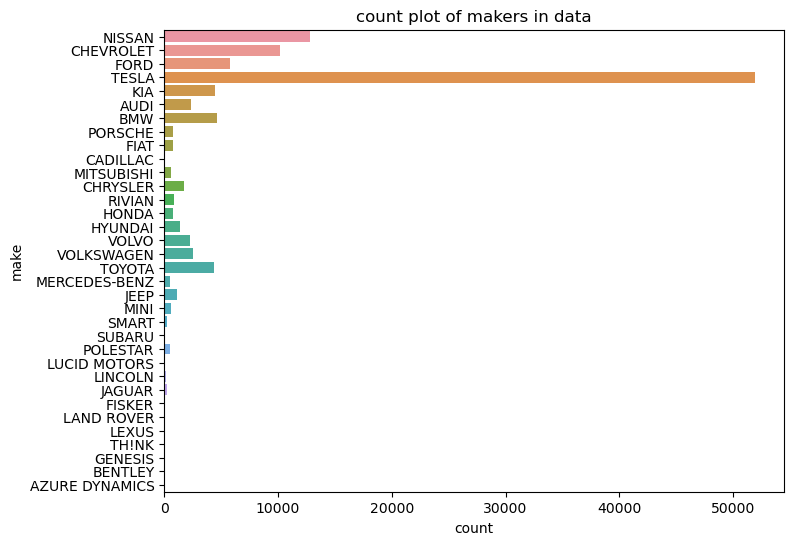

In [23]:
plt.figure(figsize=(8, 6))
plt.title("count plot of makers in data")
sns.countplot(y = data['make']) 
plt.show()

In [24]:
data['model year'].value_counts()

2022    26455
2021    18277
2018    14190
2020    10998
2019    10216
2017     8598
2016     5709
2015     4918
2013     4669
2014     3665
2023     1863
2012     1695
2011      835
2010       24
2008       23
2000       10
1999        3
2002        2
1997        1
1998        1
Name: model year, dtype: int64

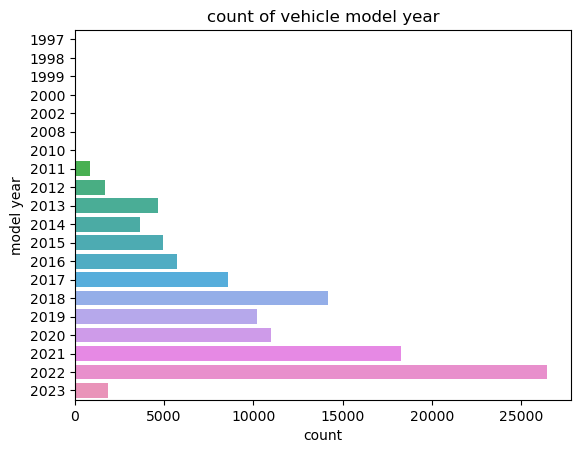

In [25]:
sns.countplot( y = data['model year'])
plt.title("count of vehicle model year")
plt.show()

In [26]:
data['electric vehicle type'].value_counts()

Battery Electric Vehicle (BEV)            85732
Plug-in Hybrid Electric Vehicle (PHEV)    26420
Name: electric vehicle type, dtype: int64

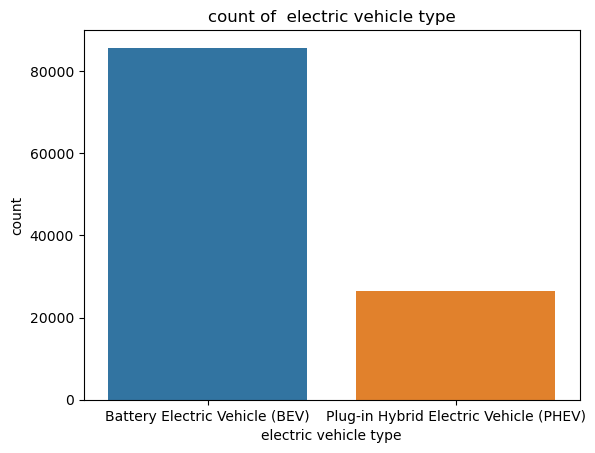

In [27]:
sns.countplot(data['electric vehicle type'])
plt.title('count of  electric vehicle type')
plt.show()

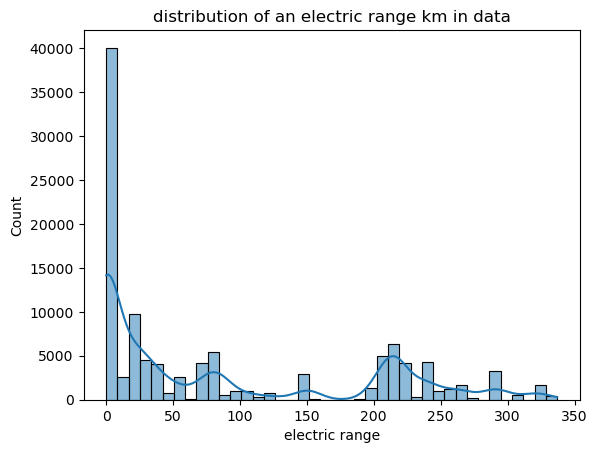

In [28]:
sns.histplot(data['electric range'] , kde =True)
plt.title("distribution of an electric range km in data")
plt.show()

In [29]:
print("Average range of the km in electric vaachile in data : " , data['electric range'].mean())

Average range of the km in electric vaachile in data :  87.82965083101504


In [30]:
data['electric utility'].value_counts().head(20)

PUGET SOUND ENERGY INC||CITY OF TACOMA - (WA)                                            40231
PUGET SOUND ENERGY INC                                                                   22166
CITY OF SEATTLE - (WA)|CITY OF TACOMA - (WA)                                             21439
BONNEVILLE POWER ADMINISTRATION||PUD NO 1 OF CLARK COUNTY - (WA)                          6522
BONNEVILLE POWER ADMINISTRATION||CITY OF TACOMA - (WA)||PENINSULA LIGHT COMPANY           5049
PUGET SOUND ENERGY INC||PUD NO 1 OF WHATCOM COUNTY                                        2670
BONNEVILLE POWER ADMINISTRATION||AVISTA CORP||INLAND POWER & LIGHT COMPANY                1679
BONNEVILLE POWER ADMINISTRATION||PUD 1 OF SNOHOMISH COUNTY                                1010
PACIFICORP                                                                                 847
BONNEVILLE POWER ADMINISTRATION||PUD NO 1 OF BENTON COUNTY                                 802
BONNEVILLE POWER ADMINISTRATION||ORCAS POWER & LIG

In [31]:
data['base msrp'].value_counts()

0         108654
69900       1493
31950        406
52900        213
32250        158
54950        135
59900        134
39995        118
36900        100
44100         95
64950         82
33950         78
45600         76
52650         67
34995         58
36800         50
55700         47
53400         28
110950        24
98950         23
81100         19
102000        19
90700         18
75095         16
184400        12
43700         10
109000         7
89100          7
91250          4
845000         1
Name: base msrp, dtype: int64

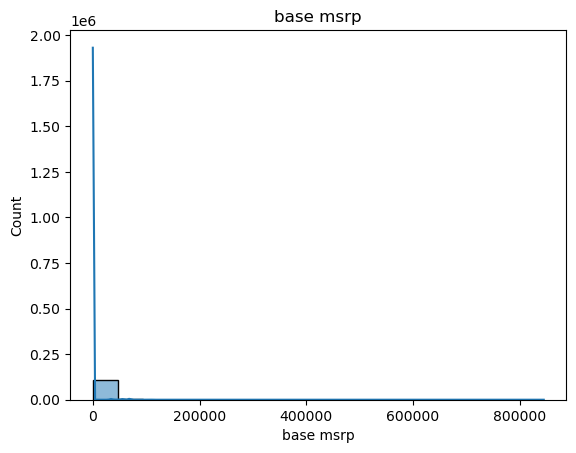

In [32]:
sns.histplot(data['base msrp'] , kde =True)
plt.title("base msrp")
plt.show()


### Bivariate analysis 

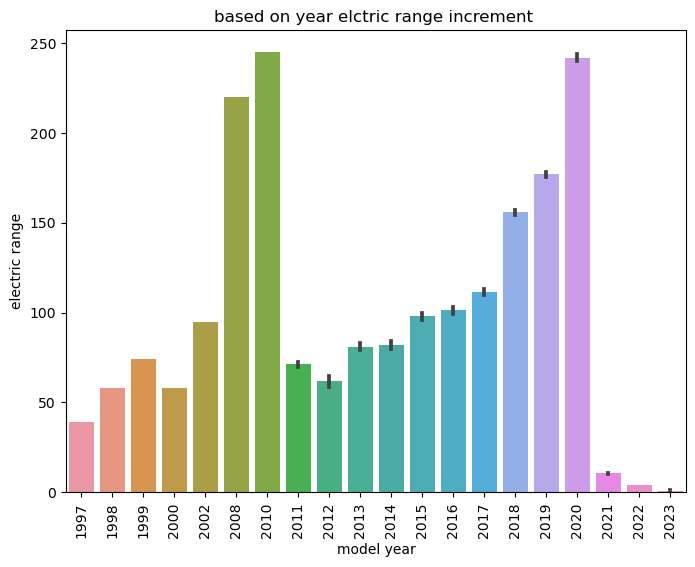

In [33]:
plt.figure(figsize=(8 , 6 ))
sns.barplot(data = data , x = 'model year' , y = "electric range")
plt.title("based on year elctric range increment ")
plt.xticks(rotation = 90)
plt.show()

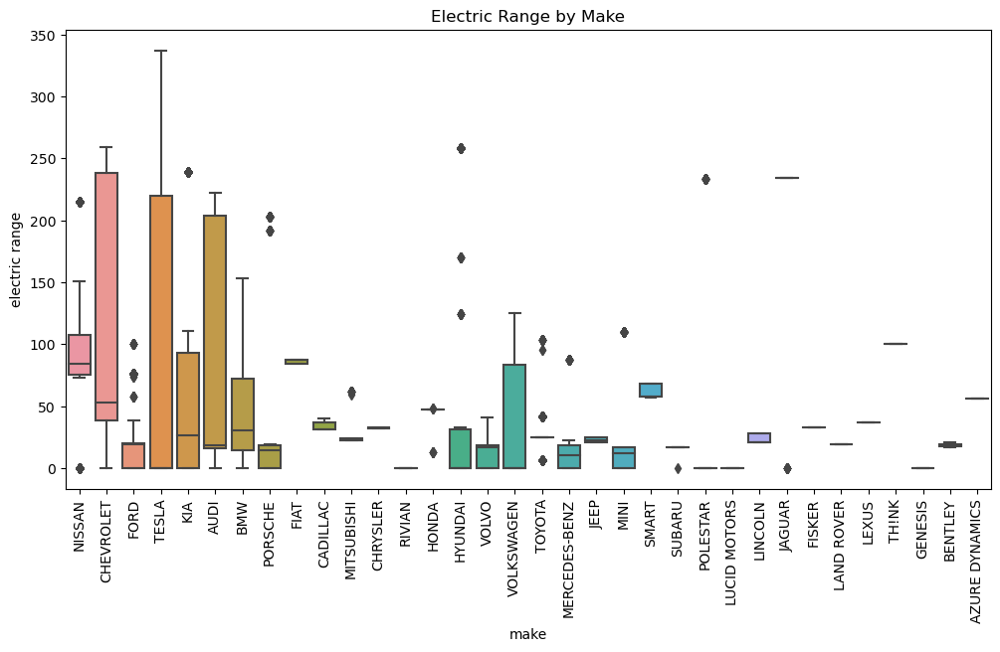

In [34]:
plt.figure(figsize=(12,6))
sns.boxplot(x='make', y='electric range', data=data)
plt.title('Electric Range by Make')
plt.xticks(rotation=90)
plt.show()

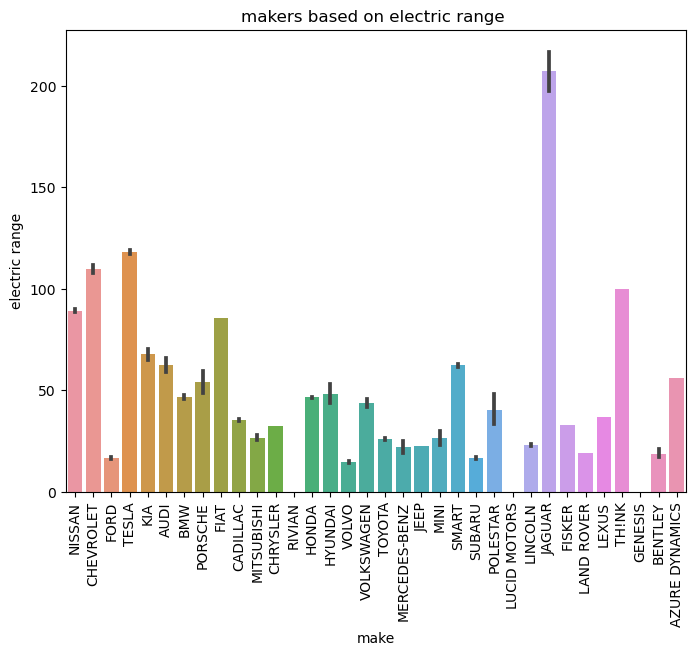

In [35]:
plt.figure(figsize=(8 , 6 ))

sns.barplot(data = data , x = 'make' , y = 'electric range')
plt.title("makers based on electric range ")
plt.xticks(rotation = 90)
plt.show()

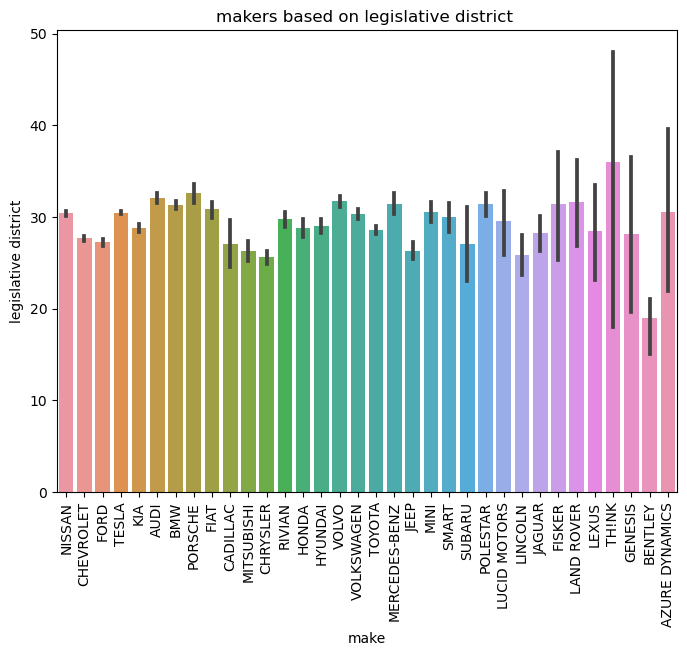

In [36]:
plt.figure(figsize=(8 , 6 ))

sns.barplot(data = data , x = 'make' , y = 'legislative district')
plt.title("makers based on legislative district ")
plt.xticks(rotation = 90)
plt.show()

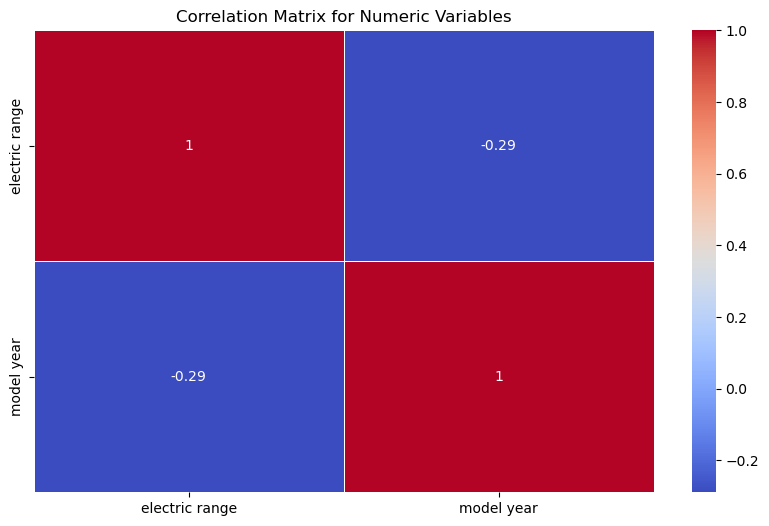

In [37]:


# Correlation Matrix for numeric columns
plt.figure(figsize=(10,6))
correlation_matrix = data[['electric range', 'model year']].corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Correlation Matrix for Numeric Variables')
plt.show()



In [38]:
data

,vin (1-10),county,city,state,postal code,model year,make,model,electric vehicle type,clean alternative fuel vehicle (cafv) eligibility,electric range,base msrp,legislative district,dol vehicle id,vehicle location,electric utility,2020 census tract
2,JN1AZ0CP8B,Yakima,Yakima,WA,98901,2011,NISSAN,LEAF,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,73,0,15.0,218972519,POINT (-120.50721 46.60448),PACIFICORP,53077001602
3,1G1FW6S08H,Skagit,Concrete,WA,98237,2017,CHEVROLET,BOLT EV,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,238,0,39.0,186750406,POINT (-121.7515 48.53892),PUGET SOUND ENERGY INC,53057951101
4,3FA6P0SU1K,Snohomish,Everett,WA,98201,2019,FORD,FUSION,Plug-in Hybrid Electric Vehicle (PHEV),Not eligible due to low battery range,26,0,38.0,2006714,POINT (-122.20596 47.97659),PUGET SOUND ENERGY INC,53061041500
5,5YJ3E1EB5J,Snohomish,Bothell,WA,98021,2018,TESLA,MODEL 3,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,215,0,1.0,475635324,POINT (-122.18384 47.8031),PUGET SOUND ENERGY INC,53061051916
6,1N4AZ0CP4D,Snohomish,Everett,WA,98203,2013,NISSAN,LEAF,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,75,0,38.0,253546023,POINT (-122.23019 47.94949),PUGET SOUND ENERGY INC,53061040900
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
112629,7SAYGDEF2N,King,Duvall,WA,98019,2022,TESLA,MODEL Y,Battery Electric Vehicle (BEV),Eligibility unknown as battery range has not b...,0,0,45.0,217955265,POINT (-121.98609 47.74068),PUGET SOUND ENERGY INC||CITY OF TACOMA - (WA),53033032401
112630,1N4BZ1CP7K,San Juan,Friday Harbor,WA,98250,2019,NISSAN,LEAF,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,150,0,40.0,103663227,POINT (-123.01648 48.53448),BONNEVILLE POWER ADMINISTRATION||ORCAS POWER &...,53055960301
112631,1FMCU0KZ4N,King,Vashon,WA,98070,2022,FORD,ESCAPE,Plug-in Hybrid Electric Vehicle (PHEV),Clean Alternative Fuel Vehicle Eligible,38,0,34.0,193878387,POINT (-122.4573 47.44929),PUGET SOUND ENERGY INC||CITY OF TACOMA - (WA),53033027702
112632,KNDCD3LD4J,King,Covington,WA,98042,2018,KIA,NIRO,Plug-in Hybrid Electric Vehicle (PHEV),Not eligible due to low battery range,26,0,47.0,125039043,POINT (-122.09124 47.33778),PUGET SOUND ENERGY INC||CITY OF TACOMA - (WA),53033032007


In [39]:
ev_counts_by_state = data.groupby('state').size().reset_index(name='EV Count')

#  Create Choropleth Map
fig = px.choropleth(
    ev_counts_by_state,  
    locations='state', 
    locationmode='USA-states',  # Tells plotly we're using US state abbreviations
    color='EV Count',  # Variable to use for color intensity
    color_continuous_scale="Viridis",  # Color scale
    scope="usa",  # Focus on the USA
    title="Number of Electric Vehicles by State",
    labels={'EV Count':'Number of EVs'}  # Label for color bar
)

# Show the plot
fig.show()



In [40]:
data

,vin (1-10),county,city,state,postal code,model year,make,model,electric vehicle type,clean alternative fuel vehicle (cafv) eligibility,electric range,base msrp,legislative district,dol vehicle id,vehicle location,electric utility,2020 census tract
2,JN1AZ0CP8B,Yakima,Yakima,WA,98901,2011,NISSAN,LEAF,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,73,0,15.0,218972519,POINT (-120.50721 46.60448),PACIFICORP,53077001602
3,1G1FW6S08H,Skagit,Concrete,WA,98237,2017,CHEVROLET,BOLT EV,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,238,0,39.0,186750406,POINT (-121.7515 48.53892),PUGET SOUND ENERGY INC,53057951101
4,3FA6P0SU1K,Snohomish,Everett,WA,98201,2019,FORD,FUSION,Plug-in Hybrid Electric Vehicle (PHEV),Not eligible due to low battery range,26,0,38.0,2006714,POINT (-122.20596 47.97659),PUGET SOUND ENERGY INC,53061041500
5,5YJ3E1EB5J,Snohomish,Bothell,WA,98021,2018,TESLA,MODEL 3,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,215,0,1.0,475635324,POINT (-122.18384 47.8031),PUGET SOUND ENERGY INC,53061051916
6,1N4AZ0CP4D,Snohomish,Everett,WA,98203,2013,NISSAN,LEAF,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,75,0,38.0,253546023,POINT (-122.23019 47.94949),PUGET SOUND ENERGY INC,53061040900
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
112629,7SAYGDEF2N,King,Duvall,WA,98019,2022,TESLA,MODEL Y,Battery Electric Vehicle (BEV),Eligibility unknown as battery range has not b...,0,0,45.0,217955265,POINT (-121.98609 47.74068),PUGET SOUND ENERGY INC||CITY OF TACOMA - (WA),53033032401
112630,1N4BZ1CP7K,San Juan,Friday Harbor,WA,98250,2019,NISSAN,LEAF,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,150,0,40.0,103663227,POINT (-123.01648 48.53448),BONNEVILLE POWER ADMINISTRATION||ORCAS POWER &...,53055960301
112631,1FMCU0KZ4N,King,Vashon,WA,98070,2022,FORD,ESCAPE,Plug-in Hybrid Electric Vehicle (PHEV),Clean Alternative Fuel Vehicle Eligible,38,0,34.0,193878387,POINT (-122.4573 47.44929),PUGET SOUND ENERGY INC||CITY OF TACOMA - (WA),53033027702
112632,KNDCD3LD4J,King,Covington,WA,98042,2018,KIA,NIRO,Plug-in Hybrid Electric Vehicle (PHEV),Not eligible due to low battery range,26,0,47.0,125039043,POINT (-122.09124 47.33778),PUGET SOUND ENERGY INC||CITY OF TACOMA - (WA),53033032007


In [41]:
data['longitude'] = data['vehicle location'].apply(lambda loc: float(loc.split()[1][1:]))
data['latitude'] = data['vehicle location'].apply(lambda loc: float(loc.split()[2][:-1]))

location_counts = data.groupby(['latitude', 'longitude', 'postal code', 'county', "state"]).size().reset_index(name='ev count')

fig_scatter_map = px.scatter_mapbox(location_counts,
                                    lat='latitude',
                                    lon='longitude',
                                    color='ev count',
                                    size='ev count',
                                    mapbox_style='carto-positron',
                                    zoom=3,
                                    center={'lat': 37.0902, 'lon': -95.7129},
                                    title='Scatter Map of Electric Vehicle Locations')

fig_scatter_map.show()

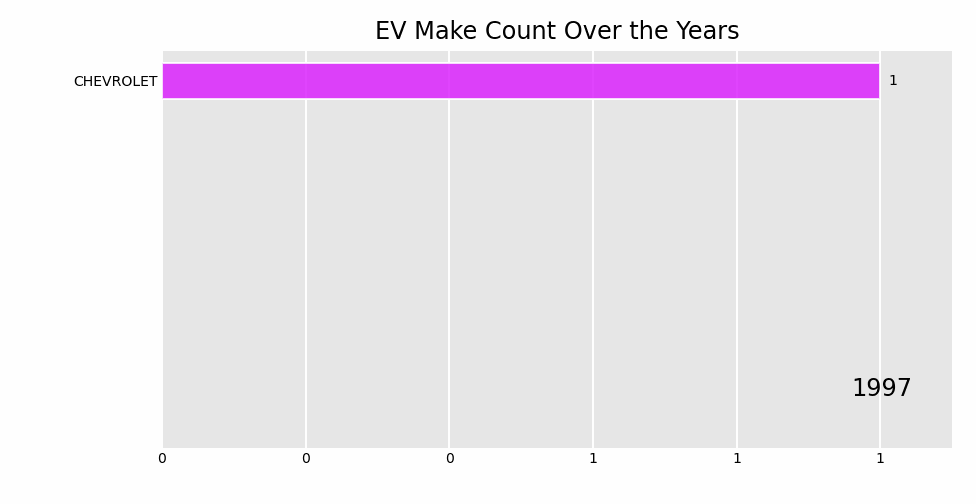

In [42]:
import plotly.express as px
import imageio
import os

# Create the scatter map
fig_scatter_map = px.scatter_mapbox(location_counts,
                                    lat='latitude',
                                    lon='longitude',
                                    color='ev count',
                                    size='ev count',
                                    mapbox_style='carto-positron',
                                    zoom=3,
                                    center={'lat': 37.0902, 'lon': -95.7129},
                                    title='Scatter Map of Electric Vehicle Locations')

# Save the figure as PNG

Image(filename='EV_make_racing_bar_plot.gif')

MovieWriter imagemagick unavailable; using Pillow instead.


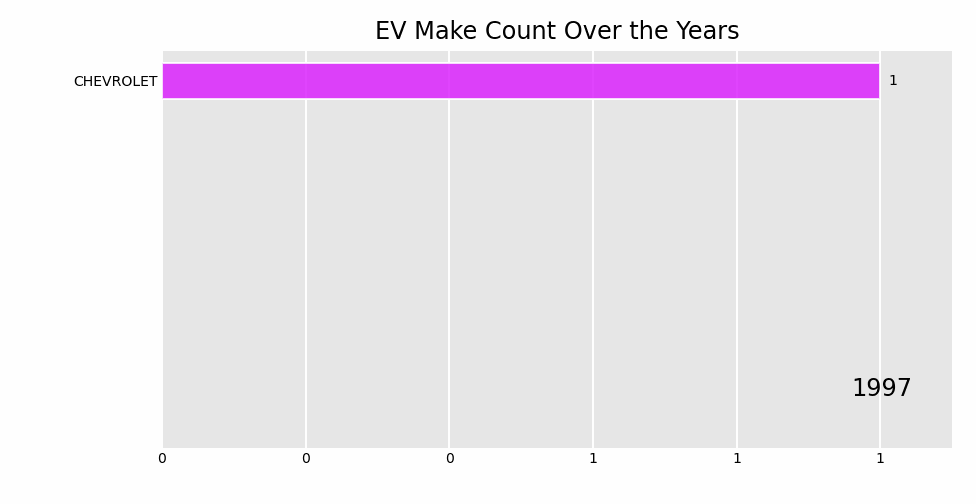

In [43]:
# Approch 2
data['model year'] = data['model year'].astype(str)

grouped_data = data.groupby(['model year', 'make']).size().reset_index(name='Count')
pivoted_data = grouped_data.pivot(index='model year', columns='make', values='Count')

# Create the bar chart race and save it as a .gif
bcr.bar_chart_race(
    df=pivoted_data, 
    filename='EV_make_racing_bar_plot.gif',  # Saves as .gif
    orientation='h', 
    sort='desc', 
    n_bars=10, 
    title='EV Make Count Over the Years', 
    filter_column_colors=True,  
    period_length=1000
)

# Display the .gif in the Jupyter notebook
Image(filename='EV_make_racing_bar_plot.gif')

In [44]:
data['city'].value_counts().head(10)

Seattle      20295
Bellevue      5919
Redmond       4199
Vancouver     4013
Kirkland      3598
Bothell       3334
Sammamish     3291
Renton        2777
Olympia       2729
Tacoma        2375
Name: city, dtype: int64